# Bayesian Optimisation: ERK single-pulse dose-response (v1)

Per FOV protocol (one phase):

1. **10 min baseline** (10 imaging frames, no stimulation)
2. **1 stim frame** at frame 10 with exposure = `pulse_duration` ms (the BO-controlled parameter)
3. **20 min observation** (20 imaging frames, no stimulation)

Total: 31 frames at 1 frame/min.

**Throughput.** The microscope can acquire 18 FOVs/min, so we use 18 FOVs per phase: 3 conditions * 2 wells/cond * 3 FOVs/well = 18 FOVs (= 6 FOVs per condition). Wells are picked fresh by `FOVFinderAgent` every phase via `ComposedAgent` (same pattern as the v8 oscillation notebook).

**BO model.** Two independent `gpax.ExactGP` fits — one per task — driven by pure-exploration (MaxVar / ALM) acquisition over the SUM of standardised posterior variances:

* **AUC**: `mean_delta_auc` (per-FOV mean of per-cell AUC of `cnr - baseline_cell` over the 20-frame observation window).
* **Frac peak-responders**: `frac_peak_responders` (per-FOV fraction of cells whose post-pulse `(cnr - baseline_cell)` peak crosses `peak_threshold` for at least `peak_min_consecutive_frames` consecutive frames). Logit-transformed before z-scoring so the GP cannot predict outside [0, 1].

Each task carries its own `candidate_hypotheses` dict (Hill / exponential / linear) and its own multi-hypothesis bookkeeping. The two tasks lock in independently — AUC may end up Hill while frac_peak_responders ends up exponential. Inspired by `gpax.hypo` from the [hypothesis-learning example](https://github.com/ziatdinovmax/gpax/blob/main/examples/gpax_hypo.ipynb).

All mean functions are defined in a notebook cell so they can be edited without touching the agent class.

In [1]:
import os
import time
import types
import logging
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Suppress JAX/XLA debug messages
os.environ["JAX_LOG_COMPILES"] = "0"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import jax
import jax.numpy as jnp

jax.config.update("jax_log_compiles", False)
for _name in list(logging.Logger.manager.loggerDict):
    if "jax" in _name or "absl" in _name:
        logging.getLogger(_name).setLevel(logging.WARNING)

# ---------------------------------------------------------------------------
# gpax/numpyro compatibility shim
# ---------------------------------------------------------------------------
# numpyro >= 0.20 removed haiku support from numpyro.contrib.module, but
# gpax 0.1.9 eagerly imports viDKL via gpax/models/__init__.py, which tries
# `from numpyro.contrib.module import random_haiku_module, haiku_module`.
# We don't use viDKL (only ExactGP), so we install stubs that raise only if
# viDKL is actually called. This MUST run before any `import gpax` (including
# the lazy ones inside the BO agent classes).
import numpyro.contrib.module as _ncm


def _haiku_unavailable(*_args, **_kwargs):
    raise NotImplementedError(
        "haiku support was removed from numpyro >= 0.20. "
        "viDKL is not available. Use ExactGP, viGP, or viSparseGP."
    )


if not hasattr(_ncm, "random_haiku_module"):
    _ncm.random_haiku_module = _haiku_unavailable
if not hasattr(_ncm, "haiku_module"):
    _ncm.haiku_module = _haiku_unavailable
# ---------------------------------------------------------------------------

import numpyro
import numpyro.distributions as dist

# Enable float64 BEFORE any gpax.ExactGP.fit() call. gpax 0.1.9 has a
# Cholesky-instability bug in float32 that produces ~99% NaN in predict()
# outputs for typical covariate-marginalised dose grids. Float64 fixes it.
import gpax.utils as _gpax_utils

_gpax_utils.enable_x64()


from faro.core.data_structures import (
    PowerChannel,
    SegmentationMethod,
)
from faro.core.controller import Controller
from faro.core.pipeline import ImageProcessingPipeline
from faro.agents.bo_optimization import (
    BO_Parameter,
    BO_Objective,
    BO_Covariate,
    StandardScalerBounds,
)
from faro.agents.bo_dose_response import DoseResponseBO
import faro.core.utils as utils

## Microscope & pipeline setup

Same hardware/pipeline layout as the v8 oscillation notebook. Channels:

- **Imaging**: miRFP (nuclear marker) + mScarlet3 (ERK-KTR reporter)
- **Stimulation**: CyanStim (whole FOV; exposure overridden per condition by the BO agent)
- **Optocheck**: mCitrine (mCitrine intensity = optoRTK expression covariate, last frame only)

In [2]:
from faro.microscope.pertzlab.jungfrau import Jungfrau

mic = Jungfrau()
mic.mmc.setChannelGroup("TTL_ERK")
mic.mmc.setProperty("TIPFSStatus", "State", "On")

In [3]:
import napari
from napari_micromanager import MainWindow

viewer = napari.Viewer()
mm_wdg = MainWindow(viewer)
mm_wdg._mmc = mic.mmc
viewer.window.add_dock_widget(mm_wdg)

In [3]:
WELLS = []
START_COL = 2
END_COL = 12
for i, row in enumerate("ABCDEFGH"):
    cols = (
        range(START_COL, END_COL + 1)
        if i % 2 == 0
        else range(END_COL, START_COL - 1, -1)
    )
    WELLS.extend(f"{row}{c}" for c in cols)

WELLS = WELLS[::-1]

In [4]:
# --- Experiment timing ---
TIME_BETWEEN_TIMESTEPS = 60  # seconds (1 frame/min)

# Phase layout (frames; 1 frame == 1 minute):
#   10 min baseline -> 1 stim frame -> 20 min observation
N_FRAMES_BASELINE = 5
N_FRAMES_OBSERVATION = 25
N_FRAMES = N_FRAMES_BASELINE + 1 + N_FRAMES_OBSERVATION  # 31
STIM_FRAME = N_FRAMES_BASELINE  # 0-based index of the single stim frame

# --- Plate calibration (saved by pymmcore-widgets MDA plate widget) ---
PLATE_CALIBRATION_PATH = r"./calib_plate_96.json"  # <-- UPDATE

# --- FOV finder knobs ---
FOV_BORDER_UM = 1250
FOV_MIN_DISTANCE_UM = 750.0
FOV_MIN_CELLS = 35
FOV_N_CANDIDATES_PER_WELL = 8

# --- Phased FOV layout ---
# 18 FOVs per phase = 3 conditions x 2 wells/condition x 3 FOVs/well
# (microscope throughput cap: 18 FOVs/min so all 18 are imaged in one
# minute, matching the 1 frame/min cadence).
N_CONDITIONS_PER_ITER = 3
WELLS_PER_CONDITION = 2
FOVS_PER_WELL = 3
N_WELLS_PER_PHASE = N_CONDITIONS_PER_ITER * WELLS_PER_CONDITION  # 6
FOVS_PER_CONDITION = WELLS_PER_CONDITION * FOVS_PER_WELL  # 6
N_FOVS = N_CONDITIONS_PER_ITER * FOVS_PER_CONDITION  # 18
N_PHASES = 13

WELLS = WELLS[: N_PHASES * N_WELLS_PER_PHASE]
WELLS = WELLS[::-1]


# --- Storage ---
base_path = "E:\\Alex"
experiment_name = "2026-05-10_bo_erk_dose_response_v1_version2"
path = os.path.join(base_path, experiment_name)

# --- Stimulation channel (exposure is overridden per condition) ---
stim_channel = PowerChannel(
    config="CyanStim",
    exposure=100,
    group="TTL_ERK",
    power=10,
)

# --- Imaging channels (every frame) ---
imaging_channels = (
    PowerChannel(config="miRFP", exposure=150, group="TTL_ERK", power=95),
    PowerChannel(config="mScarlet3", exposure=150, group="TTL_ERK", power=95),
)

# --- Optocheck channel (last frame only) ---
optocheck_channel = PowerChannel(
    config="mCitrine",
    exposure=600,
    group="TTL_ERK",
    power=95,
)
print(
    f"{N_PHASES} phases x {N_FOVS} FOVs/phase = {N_PHASES * N_FOVS} total FOVs;"
    f" cycle = {N_FRAMES} min/phase;"
    f" wells available = {len(WELLS)} (cycle_wells=True for refills)"
)

13 phases x 18 FOVs/phase = 234 total FOVs; cycle = 31 min/phase; wells available = 78 (cycle_wells=True for refills)


In [5]:
from faro.stimulation.base import StimWholeFOV
from faro.tracking.trackpy import TrackerTrackpy
from faro.feature_extraction.erk_ktr import FE_ErkKtr
from faro.feature_extraction.optocheck import OptoCheckFE
from faro.segmentation.cellpose_v4 import CellposeV4
from faro.core.writers import OmeZarrWriter

# Shared Cellpose instance: experiment pipeline + FOVFinder use the same
# segmentation so cell counts are computed identically.
segmentator = CellposeV4(
    custom_model_path="E:\\models\\cellpose\\LifeActH2B_mixed_with_only_H2B_v1",
    min_size=100,
)

pipeline = ImageProcessingPipeline(
    storage_path=path,
    segmentators=[
        SegmentationMethod(
            name="labels",
            segmentation_class=segmentator,
            use_channel=0,
            save_tracked=True,
        )
    ],
    feature_extractor=FE_ErkKtr("labels"),
    tracker=TrackerTrackpy(search_range=50),
    stimulator=StimWholeFOV(),
    feature_extractor_ref=OptoCheckFE(used_mask="labels"),
)
writer = OmeZarrWriter(storage_path=path)

Directory E:\Alex\2026-05-10_bo_erk_dose_response_v1_version2\tracks created 


## Candidate mean functions

Each task fits a `gpax.ExactGP` with one parametric mean function chosen
from a candidate set:

- **Hill** -- `V_max * d^n / (K^n + d^n)`. Saturating, biology-motivated.
- **Linear** -- `a * d + b`. Sanity baseline.
- **Exponential saturation** -- `A * (1 - exp(-d/tau))`. Softer alternative to Hill.

The default candidates live in `faro.agents.two_task_dose_response.DEFAULT_CANDIDATE_HYPOTHESES`.
You can either use them as-is or override the `candidate_hypotheses_auc` /
`candidate_hypotheses_frac` kwargs of `TwoTaskDoseResponseBO` with your own
`{name: (mean_fn, mean_fn_prior)}` dict.

**Naming convention**: `gpax` 0.1.x's predict path reconstructs per-sample
params from the MCMC trace using sample-site names as keys. So `mean_fn_prior`
must use prefixed names (e.g. `numpyro.sample("hill_vmax", ...)`) that match
the keys consumed by `mean_fn`. The defaults already follow this.


In [6]:
from faro.agents.two_task_dose_response import (
    DEFAULT_CANDIDATE_HYPOTHESES,
    hill_mean_fn,
    hill_mean_fn_prior,
    linear_mean_fn,
    linear_mean_fn_prior,
    exponential_mean_fn,
    exponential_mean_fn_prior,
)

# Per-task candidate dicts. Edit freely -- the agent treats AUC and frac
# independently, so you can give them different candidate sets.
#
# AUC (mean_delta_auc): unbounded continuous. Hill is biologically motivated
# (saturating dose-response of integrated signal); exponential is a softer
# alternative; linear is a sanity baseline.
CANDIDATE_HYPOTHESES_AUC = dict(DEFAULT_CANDIDATE_HYPOTHESES)

# frac_peak_responders: bounded in [0, 1] -- logit-transformed before fitting.
# All three forms are meaningful on the logit scale (linear-in-logit = sigmoid
# in probability space).
CANDIDATE_HYPOTHESES_FRAC = dict(DEFAULT_CANDIDATE_HYPOTHESES)

print(f"AUC candidates : {list(CANDIDATE_HYPOTHESES_AUC)}")
print(f"frac candidates: {list(CANDIDATE_HYPOTHESES_FRAC)}")

AUC candidates : ['hill', 'linear', 'exponential']
frac candidates: ['hill', 'linear', 'exponential']


## Two-task BO subclass (now lives in `faro/agents/two_task_dose_response.py`)

`TwoTaskDoseResponseBO` extends `DoseResponseBO`. Highlights:

1. **Peak-based responder counting (multiplicative).** A cell counts as a
   peak-responder iff `post_stim_cnr / baseline_cnr > peak_ratio` for at least
   `peak_min_consecutive_frames` consecutive observation frames. This replaces
   v1's misleadingly named additive `peak_threshold` (which gated on
   `delta_cnr > 1.5` rather than `cnr_ratio > 1.5`).

2. **Two independent GPs.** Each task (`auc`, `frac`) has its own
   `candidate_hypotheses` dict and its own per-task hypothesis-learning state
   (visit counts, mean reward per candidate, obj_history). `frac` is
   logit-transformed before z-scoring.

3. **Per-task hypothesis selection (canonical `gpax.hypo` pattern,
   arXiv:2112.06649).** Two regimes:
   - **Warmup** (`n_warmup_phases` phases): fit ALL candidates on the same
     data. The lowest-median-uncertainty winner gets +1 (raw count) on its
     reward slot. After warmup, the raw counts are normalised to
     win frequency in [0, 1].
   - **Post-warmup**: `gpax.hypo.sample_next(method="eps-greedy")` picks one
     candidate per phase. Reward is +1 if median predictive variance dropped
     vs the previous phase, -1 otherwise; running mean tracked via
     `gpax.hypo.update_record`.

   **No model is ever permanently locked in** -- the algorithm rotates away
   from a candidate whose variance landscape stalls picks (the
   v1 "4900 ms loop" mode).

4. **AUC-primary joint acquisition.** Posterior variance per task -> z-score
   across the candidate grid -> weighted sum: `z(var_auc) + frac_acq_weight *
   z(var_frac)`. AUC dominates picks; frac contributes only if its signal is
   strong (it's mostly zero in current data given any reasonable
   `peak_ratio`).

5. **Cross-phase repulsion.** `penalty="inverse_distance"` at construction
   means the *first* pick of every batch is also penalised against all prior
   measurements (within-batch repulsion is set by `batch_penalty_factor`).
   This was off by default in earlier versions.

6. **Bounded ARD lengthscale + reproducible HMC seed.** `lengthscale_prior_dist`
   is plumbed through to `gpax.ExactGP`. Per-phase RNG keys are derived from
   `rng_seed + phase_id` so HMC traces are deterministic phase-by-phase.

7. **Checkpoint extension.** `save_model` is overridden to also persist the
   per-task hypothesis state (`record`, `obj_history`, `hypothesis_log`,
   `n_warmup_phases_done`) so a crashed run can resume without restarting
   the warmup.


In [7]:
from faro.agents.two_task_dose_response import (
    TwoTaskDoseResponseBO,
    _logit,  # exposed for cell viz-gp
    _inv_logit,  # exposed for cell viz-gp
)

## Configure and run the BO experiment

**Parameter space:**

- `pulse_duration`: 0 ms - 5000 ms in 10 ms steps (501 levels).

**Covariates:** `n_cells`, `optortk_expression` (log-scaled), `baseline_cnr`.
Marginalised over during acquisition (joint mode).

**Tasks (modelled jointly with AUC-primary acquisition):**

- `mean_delta_auc` -- per-FOV mean of per-cell AUC of `(cnr - baseline_cell)`
  over the observation window. **Primary objective** in the joint acquisition.
- `frac_peak_responders` -- per-FOV fraction of cells whose post-stim
  `cnr / baseline_cnr` exceeds `peak_ratio=1.5` for `peak_min_consecutive_frames=2`
  consecutive frames. Logit-transformed before z-scoring. Contributes to
  acquisition with weight `frac_acq_weight=0.3`.

`BO_Objective` is required by the framework but acts only as a label here
(the `goal` is ignored -- acquisition is `z(var_auc) + frac_acq_weight *
z(var_frac)` over the unmeasured grid, with inverse-distance penalty).

**Phase budget:** `n_initial_phases=2` (farthest-point), then BO phases
driven by canonical `gpax.hypo` eps-greedy. The first `n_warmup_phases=3`
BO phases fit ALL candidates per phase (canonical warmup); subsequent phases
use eps-greedy with `eps=0.3`. **No candidate is ever locked in.**

With `N_PHASES=13`: 2 farthest-point + 3 warmup + 8 eps-greedy.

**Cross-phase repulsion:** `penalty="inverse_distance", penalty_factor=2.0`
makes the first pick of every batch also avoid previously-measured doses
(within-batch repulsion is on via `batch_penalty_factor=10`).


In [9]:
from faro.agents import FOVFinderAgent, ComposedAgent
import numpyro.distributions as dist

bo_params = [
    BO_Parameter(name="pulse_duration", bounds=(25.0, 5000.0), spacing=25.0),
]

bo_covariates = [
    BO_Covariate(name="n_cells"),
    BO_Covariate(name="optortk_expression", log_scale=True),
    BO_Covariate(name="baseline_cnr"),
]

# `goal` is a no-op label -- acquisition is AUC-primary joint pure-exploration --
# but BO_Objective is a required field in the framework.
bo_objective = BO_Objective(name="mean_delta_auc", goal="maximize")

fov_finder = FOVFinderAgent(
    microscope=mic,
    well_plate_plan=PLATE_CALIBRATION_PATH,
    wells=WELLS,
    wells_per_phase=N_WELLS_PER_PHASE,
    fovs_per_well=FOVS_PER_WELL,
    n_candidates_per_well=FOV_N_CANDIDATES_PER_WELL,
    border_um=FOV_BORDER_UM,
    min_distance_um=FOV_MIN_DISTANCE_UM,
    min_cells=FOV_MIN_CELLS,
    max_cells=250,
    imaging_channels=(imaging_channels[0],),  # only seg channel for finder scan
    segmentator=segmentator,
    seg_channel_index=0,
    random_seed=None,
    selection_mode="extremes",
    cycle_wells=True,
    verbose=False,
    z=None,
)
print(
    f"FOVFinder: {len(WELLS)} wells queued -> "
    f"{fov_finder.n_remaining_phases} phases @ {N_WELLS_PER_PHASE} wells/phase"
)

agent = TwoTaskDoseResponseBO(
    storage_path=path,
    n_frames_baseline=N_FRAMES_BASELINE,
    n_frames_observation=N_FRAMES_OBSERVATION,
    time_between_timesteps=TIME_BETWEEN_TIMESTEPS,
    imaging_channels=imaging_channels,
    stim_channel=stim_channel,
    optocheck_channel=optocheck_channel,
    min_track_fraction=0.8,
    max_baseline_cnr=1.0,
    save_checkpoints=True,
    plot_live=True,
    parameters_to_optimize=bo_params,
    objective_metric=bo_objective,
    bo_covariates=bo_covariates,
    n_iterations=N_PHASES,
    n_conditions_per_iter=N_CONDITIONS_PER_ITER,
    n_initial_phases=2,
    initial_exploration_cap=None,
    n_cov_samples=40,
    ei_num_samples=8,
    verbose=True,
    # ------ cross-phase repulsion (was missing in v1; pinned the 4900 loop) -----
    penalty="inverse_distance",
    penalty_factor=2.0,
    batch_penalty_factor=10,
    # ------ two-task / hypothesis-learning settings (canonical gpax.hypo) -------
    candidate_hypotheses_auc=CANDIDATE_HYPOTHESES_AUC,
    candidate_hypotheses_frac=CANDIDATE_HYPOTHESES_FRAC,
    eps_greedy_eps=0.3,  # post-warmup eps-greedy
    n_warmup_phases=3,  # fit-all-candidates phases (was 2; 3 is safer for noisier rewards)
    frac_acq_weight=0.3,  # AUC-primary
    lengthscale_prior_dist=dist.Uniform(0.1, 1.0),  # bounded ARD lengthscale
    peak_ratio=1.5,  # responder = cnr_ratio > 1.5x baseline
    peak_min_consecutive_frames=2,
    gp_kernel="Matern",
    gp_num_warmup=400,
    gp_num_samples=800,
    rng_seed=42,  # reproducible HMC traces
)

composed_agent = ComposedAgent(
    inner_agent=agent,
    pre_phase_agents=[fov_finder],
    n_phases=N_PHASES,
)

ctrl = Controller(mic, pipeline, writer=writer, agent=composed_agent)

n_post_warmup = N_PHASES - agent.n_initial_phases - agent.n_warmup_phases
print(f"Parameter grid: {len(agent.x_total_linespace)} candidate pulse_duration values")
print(
    f"Phases: {N_PHASES}  ({agent.n_initial_phases} farthest-point + "
    f"{agent.n_warmup_phases} warmup (fit-all-candidates) + "
    f"{n_post_warmup} eps-greedy (eps={agent.eps_greedy_eps}, never locks))"
)
print(
    f"Conditions per phase: {N_CONDITIONS_PER_ITER}  "
    f"FOVs per condition: {FOVS_PER_CONDITION}  Total FOVs/phase: {N_FOVS}"
)
print(
    f"Tasks: {agent.TASKS}  -> columns: "
    f"{[agent.task_columns[t] for t in agent.TASKS]}"
)
print(
    f"Acquisition: z(var_auc) + {agent.frac_acq_weight}*z(var_frac) "
    f"+ inverse-distance cross-phase repulsion"
)

FOVFinder: 78 wells queued -> 13 phases @ 6 wells/phase
Parameter grid: 200 candidate pulse_duration values
Phases: 13  (2 farthest-point + 3 warmup (fit-all-candidates) + 8 eps-greedy (eps=0.3, never locks))
Conditions per phase: 3  FOVs per condition: 6  Total FOVs/phase: 18
Tasks: ('auc', 'frac')  -> columns: ['mean_delta_auc', 'frac_peak_responders']
Acquisition: z(var_auc) + 0.3*z(var_frac) + inverse-distance cross-phase repulsion



=== ComposedAgent: phase 1/13 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:43: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 0 — selected FOVs:
    A12_0000: 40 cells
    A12_0001: 100 cells
    A12_0002: 210 cells
    B12_0000: 35 cells
    B12_0001: 45 cells
    B12_0002: 199 cells
    B11_0000: 123 cells
    B11_0001: 179 cells
    B11_0002: 201 cells
    B10_0000: 72 cells
    B10_0001: 111 cells
    B10_0002: 155 cells
    B9_0000: 120 cells
    B9_0001: 152 cells
    B9_0002: 205 cells
    B8_0000: 76 cells
    B8_0001: 142 cells
    B8_0002: 212 cells
=== Phase 0: initial batch 1/2 ===
  Condition 0: {'pulse_duration': np.float64(450.0)}
  Condition 1: {'pulse_duration': np.float64(5000.0)}
  Condition 2: {'pulse_duration': np.float64(2725.0)}
  Created 558 events for phase 0
    Cond 0 (FOVs 0-5): pulse_duration=450ms
    Cond 1 (FOVs 6-11): pulse_duration=5000ms
    Cond 2 (FOVs 12-17): pulse_duration=2725ms
  optoRTK retry summary: 1/1 recovered after re-read
  [save_model] no model to save (BO has not fit yet)


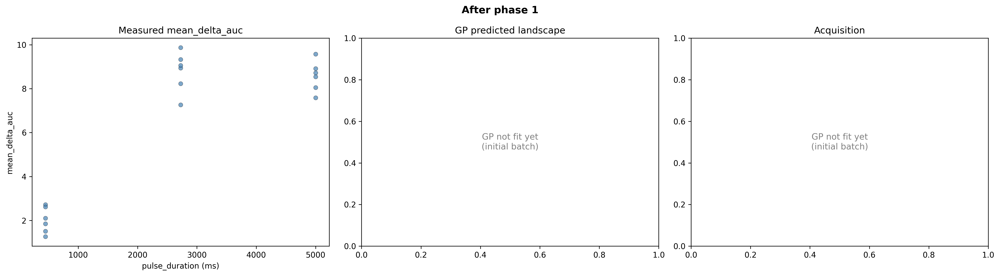


=== ComposedAgent: phase 2/13 ===
[FOVFinderAgent] Phase 1 — selected FOVs:
    B7_0000: 136 cells
    B7_0001: 163 cells
    B7_0002: 215 cells
    B6_0000: 148 cells
    B6_0001: 163 cells
    B6_0002: 188 cells
    B5_0000: 146 cells
    B5_0001: 173 cells
    B5_0002: 212 cells
    B4_0000: 128 cells
    B4_0001: 158 cells
    B4_0002: 210 cells
    B3_0000: 135 cells
    B3_0001: 164 cells
    B3_0002: 220 cells
    B2_0000: 51 cells
    B2_0001: 90 cells
    B2_0002: 157 cells
=== Phase 1: initial batch 2/2 ===
  Condition 0: {'pulse_duration': np.float64(1575.0)}
  Condition 1: {'pulse_duration': np.float64(3850.0)}
  Condition 2: {'pulse_duration': np.float64(2150.0)}
  Created 558 events for phase 1
    Cond 0 (FOVs 18-23): pulse_duration=1575ms
    Cond 1 (FOVs 24-29): pulse_duration=3850ms
    Cond 2 (FOVs 30-35): pulse_duration=2150ms
  optoRTK retry summary: 1/1 recovered after re-read
  [save_model] no model to save (BO has not fit yet)


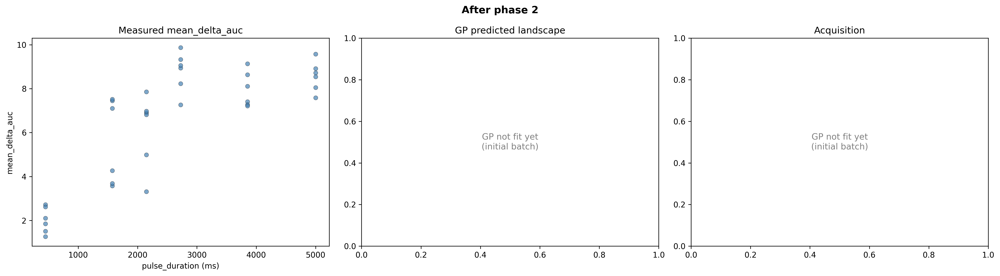


=== ComposedAgent: phase 3/13 ===
[FOVFinderAgent] Phase 2 — selected FOVs:
    C2_0000: 64 cells
    C2_0001: 106 cells
    C2_0002: 234 cells
    C3_0000: 117 cells
    C3_0001: 164 cells
    C3_0002: 206 cells
    C4_0000: 56 cells
    C4_0001: 172 cells
    C4_0002: 200 cells
    C5_0000: 108 cells
    C5_0001: 152 cells
    C5_0002: 187 cells
    C6_0000: 114 cells
    C6_0001: 157 cells
    C6_0002: 164 cells
    C7_0000: 128 cells
    C7_0001: 141 cells
    C7_0002: 159 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: warmup phase 1/3 -- fitting all 3 candidates]
      hill: obj=0.1076, log_evidence=-14.300
      linear: obj=0.0718, log_evidence=-15.466
      exponential: obj=0.1112, log_evidence=-17.242
    [auc: warmup winner='linear', obj=0.0718]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: warmup phase 1/3 -- fitting all 3 candidates]
      hill: obj=0.1292, log_evidence=-18.246
      linear: obj=0.0892, log

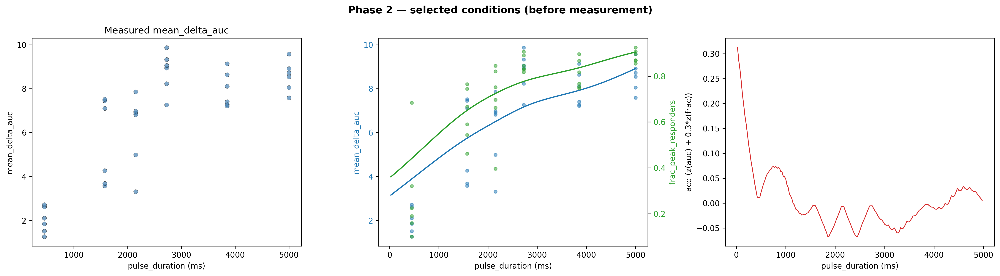

  Created 558 events for phase 2
    Cond 0 (FOVs 36-41): pulse_duration=25ms
    Cond 1 (FOVs 42-47): pulse_duration=225ms
    Cond 2 (FOVs 48-53): pulse_duration=925ms
  optoRTK retry summary: 1/1 recovered after re-read


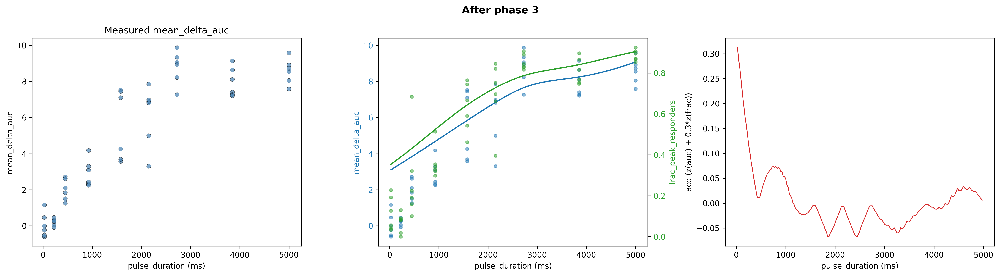


=== ComposedAgent: phase 4/13 ===
[FOVFinderAgent] Phase 3 — selected FOVs:
    C8_0000: 102 cells
    C8_0001: 152 cells
    C8_0002: 198 cells
    C9_0000: 140 cells
    C9_0001: 147 cells
    C9_0002: 167 cells
    C10_0000: 90 cells
    C10_0001: 157 cells
    C10_0002: 200 cells
    C11_0000: 114 cells
    C11_0001: 130 cells
    C11_0002: 144 cells
    C12_0000: 46 cells
    C12_0001: 93 cells
    C12_0002: 194 cells
    D12_0000: 36 cells
    D12_0001: 80 cells
    D12_0002: 198 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: warmup phase 2/3 -- fitting all 3 candidates]
      hill: obj=0.0383, log_evidence=-9.154
      linear: obj=0.0299, log_evidence=-16.484
      exponential: obj=0.0404, log_evidence=-8.091
    [auc: warmup winner='linear', obj=0.0299]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: warmup phase 2/3 -- fitting all 3 candidates]
      hill: obj=0.0945, log_evidence=-21.797
      linear: obj=0.08

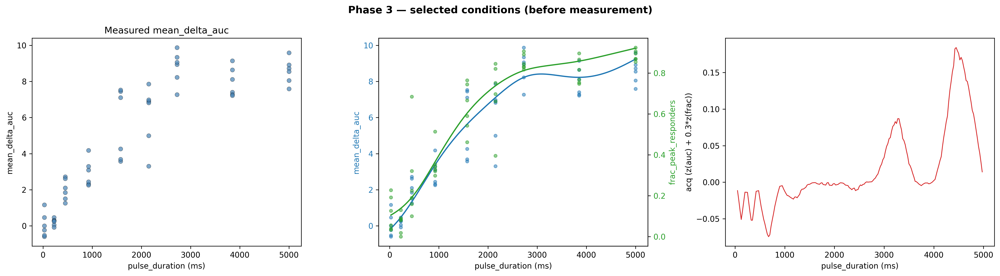

  Created 558 events for phase 3
    Cond 0 (FOVs 54-59): pulse_duration=4450ms
    Cond 1 (FOVs 60-65): pulse_duration=3275ms
    Cond 2 (FOVs 66-71): pulse_duration=4725ms
  optoRTK retry summary: 1/1 recovered after re-read


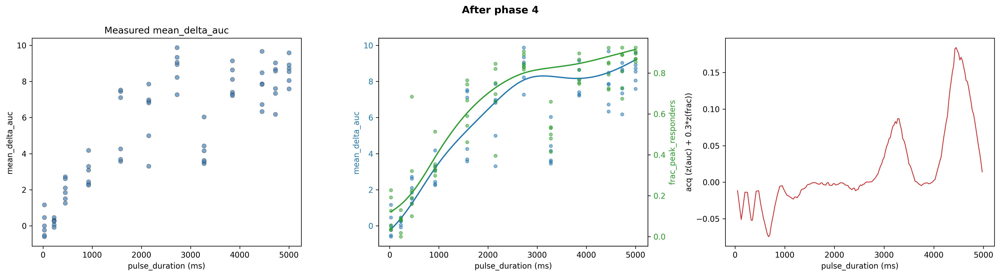


=== ComposedAgent: phase 5/13 ===
[FOVFinderAgent] Phase 4 — selected FOVs:
    D11_0000: 54 cells
    D11_0001: 101 cells
    D11_0002: 170 cells
    D10_0000: 92 cells
    D10_0001: 139 cells
    D10_0002: 197 cells
    D9_0000: 58 cells
    D9_0001: 103 cells
    D9_0002: 180 cells
    D8_0000: 115 cells
    D8_0001: 142 cells
    D8_0002: 184 cells
    D7_0000: 70 cells
    D7_0001: 138 cells
    D7_0002: 164 cells
    D6_0000: 40 cells
    D6_0001: 148 cells
    D6_0002: 172 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: warmup phase 3/3 -- fitting all 3 candidates]
      hill: obj=0.0337, log_evidence=-9.741
      linear: obj=0.0290, log_evidence=-15.251
      exponential: obj=0.0348, log_evidence=-9.272
    [auc: warmup winner='linear', obj=0.0290]
    [auc: WARMUP COMPLETE -- win frequencies: hill=0.00, linear=1.00, exponential=0.00]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: warmup phase 3/3 -- fitting all

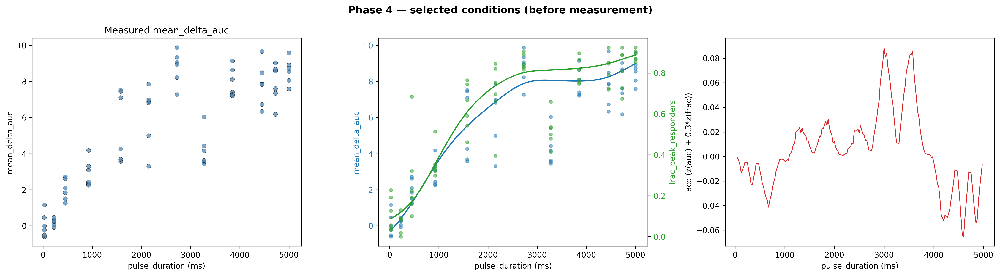

  Created 558 events for phase 4
    Cond 0 (FOVs 72-77): pulse_duration=3000ms
    Cond 1 (FOVs 78-83): pulse_duration=1250ms
    Cond 2 (FOVs 84-89): pulse_duration=1875ms
  optoRTK retry summary: 1/1 recovered after re-read


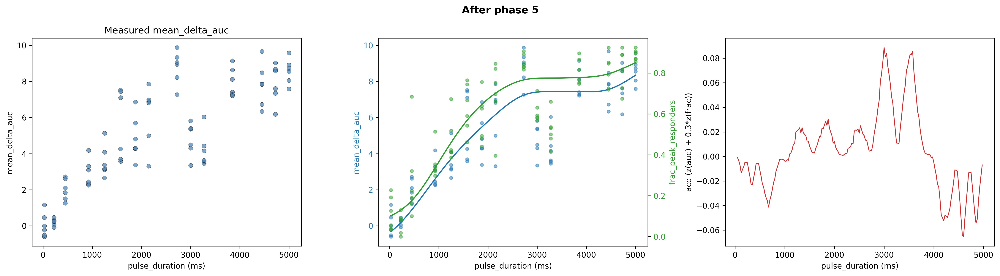


=== ComposedAgent: phase 6/13 ===
[FOVFinderAgent] Phase 5 — selected FOVs:
    D5_0000: 108 cells
    D5_0001: 155 cells
    D5_0002: 202 cells
    D4_0000: 59 cells
    D4_0001: 155 cells
    D4_0002: 182 cells
    D3_0000: 66 cells
    D3_0001: 110 cells
    D3_0002: 167 cells
    D2_0000: 40 cells
    D2_0001: 91 cells
    D2_0002: 170 cells
    E2_0000: 53 cells
    E2_0001: 113 cells
    E2_0002: 146 cells
    E3_0000: 38 cells
    E3_0001: 75 cells
    E3_0002: 201 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: eps-greedy -> 'linear'  (hill=+0.00(n=3), linear=+1.00(n=3), exponential=+0.00(n=3))]
    [auc: obj=0.0476 (prev_finite=0.0290) -> reward=-1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'linear'  (hill=+0.00(n=3), linear=+1.00(n=3), exponential=+0.00(n=3))]
    [frac: obj=0.0789 (prev_finite=0.0729) -> reward=-1]
  AUC-primary acq stats (frac_w=0.3): min=-0.0474, max=0.1002
  [reusing cac

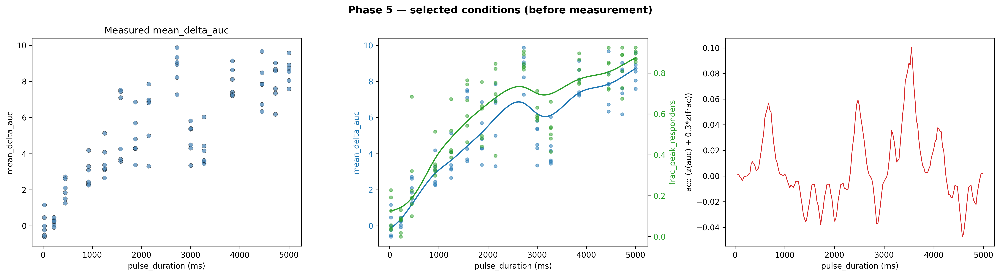

  Created 558 events for phase 5
    Cond 0 (FOVs 90-95): pulse_duration=3550ms
    Cond 1 (FOVs 96-101): pulse_duration=2475ms
    Cond 2 (FOVs 102-107): pulse_duration=4150ms
  optoRTK retry summary: 1/1 recovered after re-read


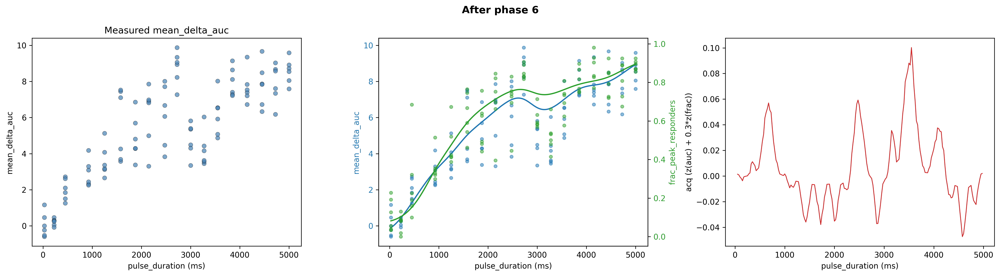


=== ComposedAgent: phase 7/13 ===
[FOVFinderAgent] Phase 6 — selected FOVs:
    E4_0000: 94 cells
    E4_0001: 141 cells
    E4_0002: 169 cells
    E5_0000: 86 cells
    E5_0001: 144 cells
    E5_0002: 180 cells
    E6_0000: 42 cells
    E6_0001: 115 cells
    E6_0002: 158 cells
    E7_0000: 67 cells
    E7_0001: 149 cells
    E7_0002: 170 cells
    E8_0000: 92 cells
    E8_0001: 138 cells
    E8_0002: 176 cells
    E9_0000: 69 cells
    E9_0001: 104 cells
    E9_0002: 143 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: eps-greedy -> 'linear'  (hill=+0.00(n=3), linear=+0.50(n=4), exponential=+0.00(n=3))]
    [auc: obj=0.0479 (prev_finite=0.0476) -> reward=-1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'hill'  (hill=+0.00(n=3), linear=+0.50(n=4), exponential=+0.00(n=3))]
    [frac: obj=0.0721 (prev_finite=0.0789) -> reward=+1]
  AUC-primary acq stats (frac_w=0.3): min=-0.0372, max=0.0714
  [reusing cach

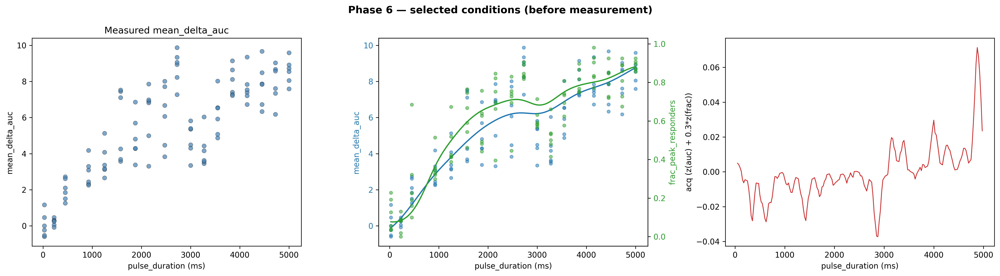

  Created 558 events for phase 6
    Cond 0 (FOVs 108-113): pulse_duration=4875ms
    Cond 1 (FOVs 114-119): pulse_duration=125ms
    Cond 2 (FOVs 120-125): pulse_duration=700ms
  optoRTK retry summary: 1/1 recovered after re-read


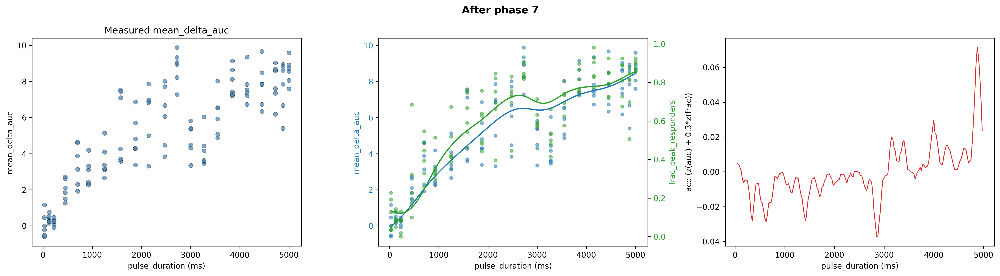


=== ComposedAgent: phase 8/13 ===
[FOVFinderAgent] Phase 7 — selected FOVs:
    E10_0000: 79 cells
    E10_0001: 119 cells
    E10_0002: 158 cells
    E11_0000: 58 cells
    E11_0001: 90 cells
    E11_0002: 187 cells
    E12_0000: 36 cells
    E12_0001: 46 cells
    E12_0002: 178 cells
    F12_0000: 47 cells
    F12_0001: 50 cells
    F12_0002: 196 cells
    F11_0000: 43 cells
    F11_0001: 118 cells
    F11_0002: 168 cells
    F10_0000: 42 cells
    F10_0001: 108 cells
    F10_0002: 139 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: eps-greedy -> 'linear'  (hill=+0.00(n=3), linear=+0.20(n=5), exponential=+0.00(n=3))]
    [auc: obj=0.0424 (prev_finite=0.0479) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'exponential'  (hill=+0.25(n=4), linear=+0.50(n=4), exponential=+0.00(n=3))]
    [frac: obj=0.0730 (prev_finite=0.0721) -> reward=-1]
  AUC-primary acq stats (frac_w=0.3): min=-0.0635, max=

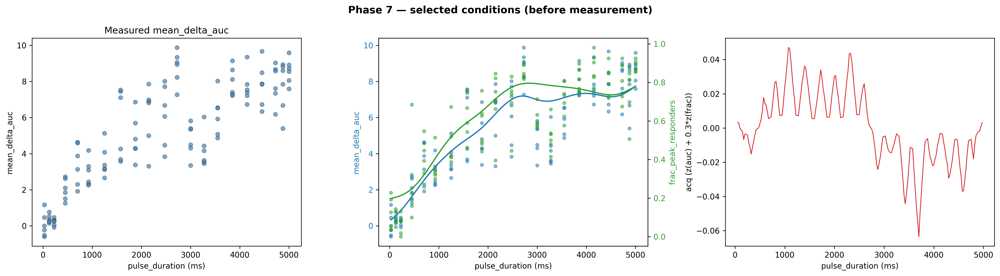

  Created 558 events for phase 7
    Cond 0 (FOVs 126-131): pulse_duration=1075ms
    Cond 1 (FOVs 132-137): pulse_duration=4000ms
    Cond 2 (FOVs 138-143): pulse_duration=2300ms
  optoRTK retry summary: 1/1 recovered after re-read


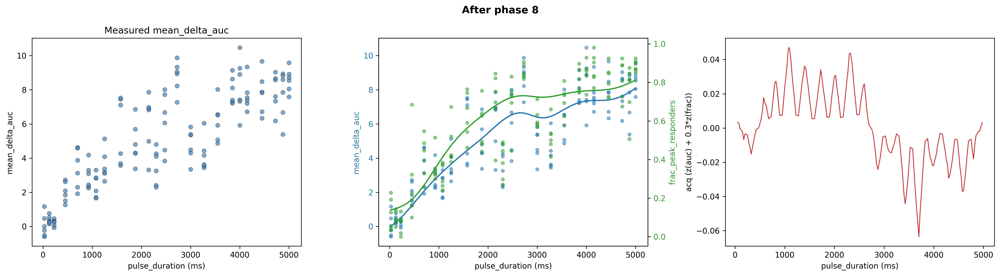


=== ComposedAgent: phase 9/13 ===
[FOVFinderAgent] Phase 8 — selected FOVs:
    F9_0000: 47 cells
    F9_0001: 100 cells
    F9_0002: 145 cells
    F8_0000: 46 cells
    F8_0001: 125 cells
    F8_0002: 200 cells
    F7_0000: 91 cells
    F7_0001: 131 cells
    F7_0002: 138 cells
    F6_0000: 91 cells
    F6_0001: 123 cells
    F6_0002: 178 cells
    F5_0000: 122 cells
    F5_0001: 153 cells
    F5_0002: 182 cells
    F4_0000: 104 cells
    F4_0001: 145 cells
    F4_0002: 187 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: eps-greedy -> 'linear'  (hill=+0.00(n=3), linear=+0.33(n=6), exponential=+0.00(n=3))]
    [auc: obj=0.0431 (prev_finite=0.0424) -> reward=-1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'linear'  (hill=+0.25(n=4), linear=+0.50(n=4), exponential=-0.25(n=4))]
    [frac: obj=0.0669 (prev_finite=0.0730) -> reward=+1]
  AUC-primary acq stats (frac_w=0.3): min=-0.0341, max=0.0381
  [reusing 

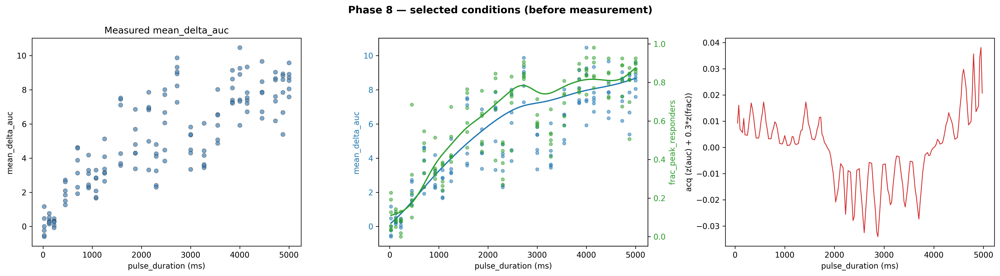

  Created 558 events for phase 8
    Cond 0 (FOVs 144-149): pulse_duration=4950ms
    Cond 1 (FOVs 150-155): pulse_duration=3150ms
    Cond 2 (FOVs 156-161): pulse_duration=3400ms
  optoRTK retry summary: 1/1 recovered after re-read


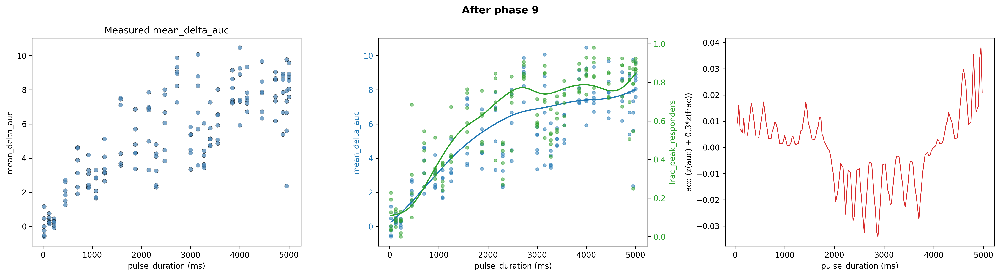


=== ComposedAgent: phase 10/13 ===
[FOVFinderAgent] Phase 9 — selected FOVs:
    F3_0000: 86 cells
    F3_0001: 132 cells
    F3_0002: 163 cells
    F2_0000: 38 cells
    F2_0001: 43 cells
    F2_0002: 126 cells
    G2_0000: 44 cells
    G2_0001: 81 cells
    G2_0002: 161 cells
    G3_0000: 57 cells
    G3_0001: 121 cells
    G3_0002: 157 cells
    G4_0000: 115 cells
    G4_0001: 159 cells
    G4_0002: 174 cells
    G5_0000: 75 cells
    G5_0001: 130 cells
    G5_0002: 175 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: eps-greedy -> 'linear'  (hill=+0.00(n=3), linear=+0.14(n=7), exponential=+0.00(n=3))]
    [auc: obj=0.0482 (prev_finite=0.0431) -> reward=-1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'hill'  (hill=+0.25(n=4), linear=+0.60(n=5), exponential=-0.25(n=4))]
    [frac: obj=0.0726 (prev_finite=0.0669) -> reward=-1]
  AUC-primary acq stats (frac_w=0.3): min=-0.0595, max=0.0542
  [reusing cach

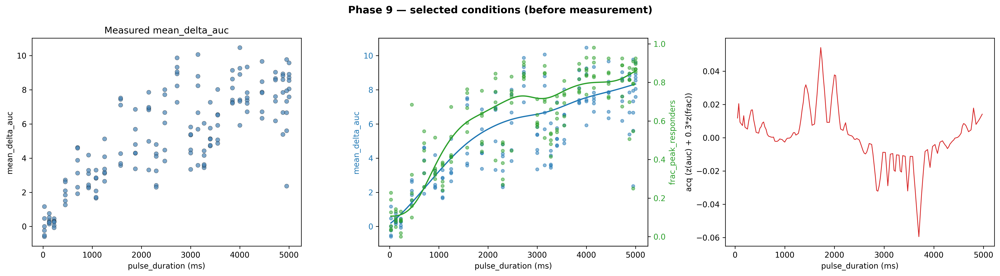

  Created 558 events for phase 9
    Cond 0 (FOVs 162-167): pulse_duration=1725ms
    Cond 1 (FOVs 168-173): pulse_duration=325ms
    Cond 2 (FOVs 174-179): pulse_duration=2000ms
  optoRTK retry summary: 1/1 recovered after re-read


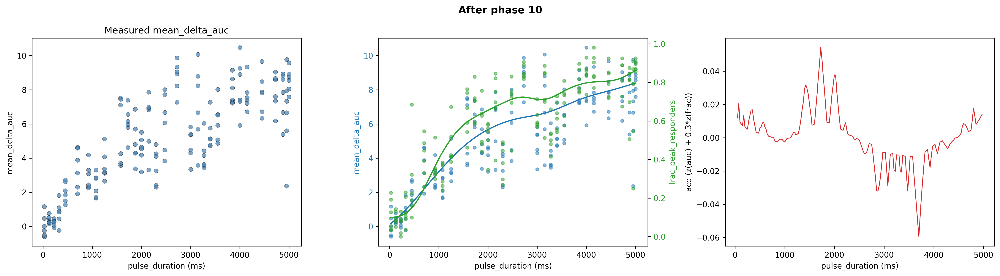


=== ComposedAgent: phase 11/13 ===
[FOVFinderAgent] Phase 10 — selected FOVs:
    G6_0000: 95 cells
    G6_0001: 128 cells
    G6_0002: 178 cells
    G7_0000: 58 cells
    G7_0001: 133 cells
    G7_0002: 170 cells
    G8_0000: 74 cells
    G8_0001: 87 cells
    G8_0002: 175 cells
    G9_0000: 68 cells
    G9_0001: 116 cells
    G9_0002: 157 cells
    G10_0000: 76 cells
    G10_0001: 104 cells
    G10_0002: 135 cells
    G11_0000: 42 cells
    G11_0001: 113 cells
    G11_0002: 142 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: eps-greedy -> 'exponential'  (hill=+0.00(n=3), linear=+0.00(n=8), exponential=+0.00(n=3))]
    [auc: obj=0.0603 (prev_finite=0.0482) -> reward=-1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'linear'  (hill=+0.00(n=5), linear=+0.60(n=5), exponential=-0.25(n=4))]
    [frac: obj=0.0666 (prev_finite=0.0726) -> reward=+1]
  AUC-primary acq stats (frac_w=0.3): min=-0.0287, max=0.0359
 

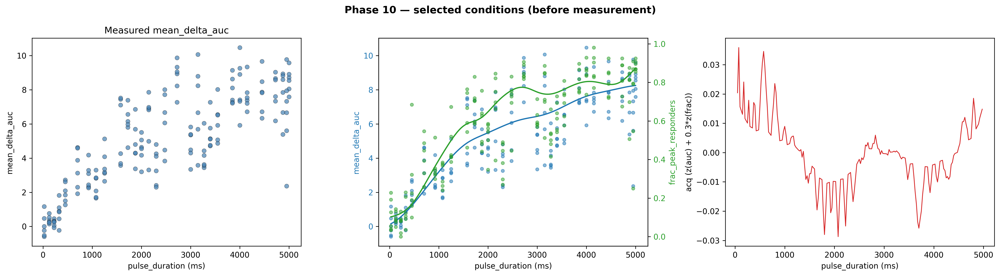

  Created 558 events for phase 10
    Cond 0 (FOVs 180-185): pulse_duration=75ms
    Cond 1 (FOVs 186-191): pulse_duration=4600ms
    Cond 2 (FOVs 192-197): pulse_duration=4800ms
  optoRTK retry summary: 1/1 recovered after re-read


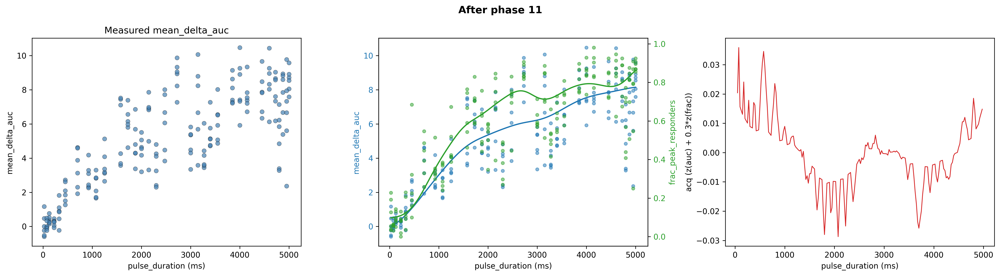


=== ComposedAgent: phase 12/13 ===


C:\Users\Jungfrau\Documents\alandolt\code\faro.worktrees\feat-agent_mode\faro\segmentation\cellpose_v4.py:43: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  masks = skimage.morphology.remove_small_objects(


[FOVFinderAgent] Phase 11 — selected FOVs:
    G12_0000: 35 cells
    G12_0001: 57 cells
    G12_0002: 205 cells
    H12_0000: 35 cells
    H12_0001: 25 cells (below min_cells)
    H12_0002: 15 cells (below min_cells)
    H11_0000: 37 cells
    H11_0001: 88 cells
    H11_0002: 123 cells
    H10_0000: 47 cells
    H10_0001: 134 cells
    H10_0002: 165 cells
    H9_0000: 43 cells
    H9_0001: 63 cells
    H9_0002: 34 cells (below min_cells)
    H8_0000: 38 cells
    H8_0001: 49 cells
    H8_0002: 99 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+0.00(n=3), linear=+0.00(n=8), exponential=-0.25(n=4))]
    [auc: obj=0.0563 (prev_finite=0.0603) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'exponential'  (hill=+0.00(n=5), linear=+0.67(n=6), exponential=-0.25(n=4))]
    [frac: obj=0.0709 (prev_finite=0.0666) -> reward=-1]
  AUC-primary acq stats (frac_w=0.3): min=-0.038

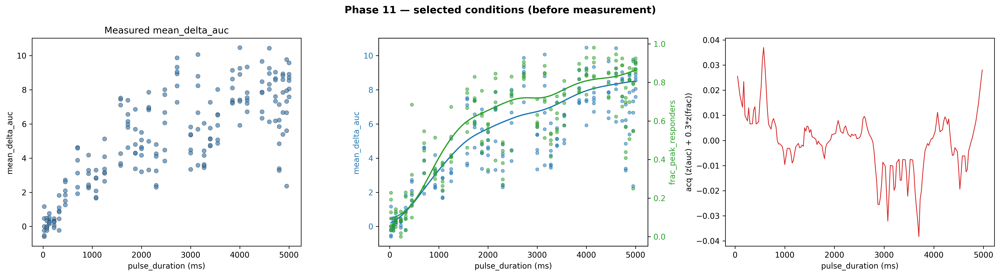

  Created 558 events for phase 11
    Cond 0 (FOVs 198-203): pulse_duration=575ms
    Cond 1 (FOVs 204-209): pulse_duration=800ms
    Cond 2 (FOVs 210-215): pulse_duration=2600ms
  optoRTK retry summary: 1/1 recovered after re-read


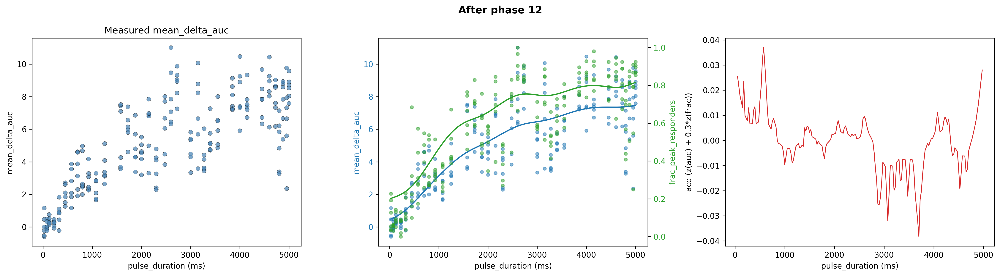


=== ComposedAgent: phase 13/13 ===
[FOVFinderAgent] Phase 12 — selected FOVs:
    H7_0000: 42 cells
    H7_0001: 62 cells
    H7_0002: 92 cells
    H6_0000: 37 cells
    H6_0001: 83 cells
    H6_0002: 130 cells
    H5_0000: 76 cells
    H5_0001: 120 cells
    H5_0002: 135 cells
    H4_0000: 56 cells
    H4_0001: 87 cells
    H4_0002: 158 cells
    H3_0000: 52 cells
    H3_0001: 66 cells
    H3_0002: 128 cells
    H2_0000: 39 cells
    H2_0001: 79 cells
    H2_0002: 148 cells
  Fitting task = 'auc' (column = 'mean_delta_auc', logit=False)
    [auc: eps-greedy -> 'hill'  (hill=+0.25(n=4), linear=+0.00(n=8), exponential=-0.25(n=4))]
    [auc: obj=0.0560 (prev_finite=0.0563) -> reward=+1]
  Fitting task = 'frac' (column = 'frac_peak_responders', logit=True)
    [frac: eps-greedy -> 'exponential'  (hill=+0.00(n=5), linear=+0.67(n=6), exponential=-0.40(n=5))]
    [frac: obj=0.0875 (prev_finite=0.0709) -> reward=-1]
  AUC-primary acq stats (frac_w=0.3): min=-0.0327, max=0.0340
  [reusing cac

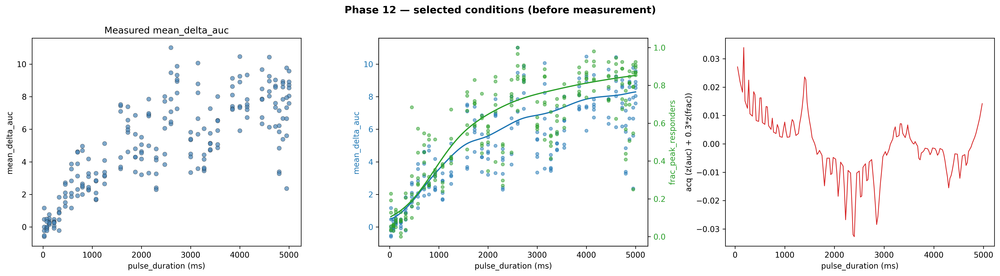

  Created 558 events for phase 12
    Cond 0 (FOVs 216-221): pulse_duration=175ms
    Cond 1 (FOVs 222-227): pulse_duration=4300ms
    Cond 2 (FOVs 228-233): pulse_duration=4075ms
  optoRTK retry summary: 1/1 recovered after re-read


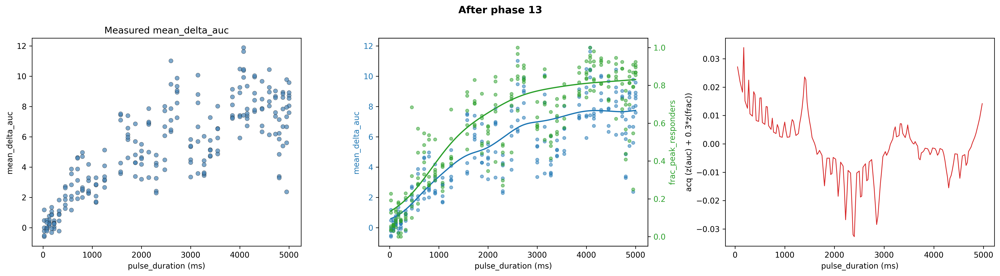

In [10]:
# Disconnect napari live view so it does not interfere with the acquisition engine.
try:
    mm_wdg._core_link.cleanup()
except Exception:
    pass

composed_agent.run()

In [11]:
# Post-processing: merge per-FOV tracks into a single dataframe.
utils.generate_exp_data_from_tracks(path)

## Visualise dose-response and hypothesis evidence

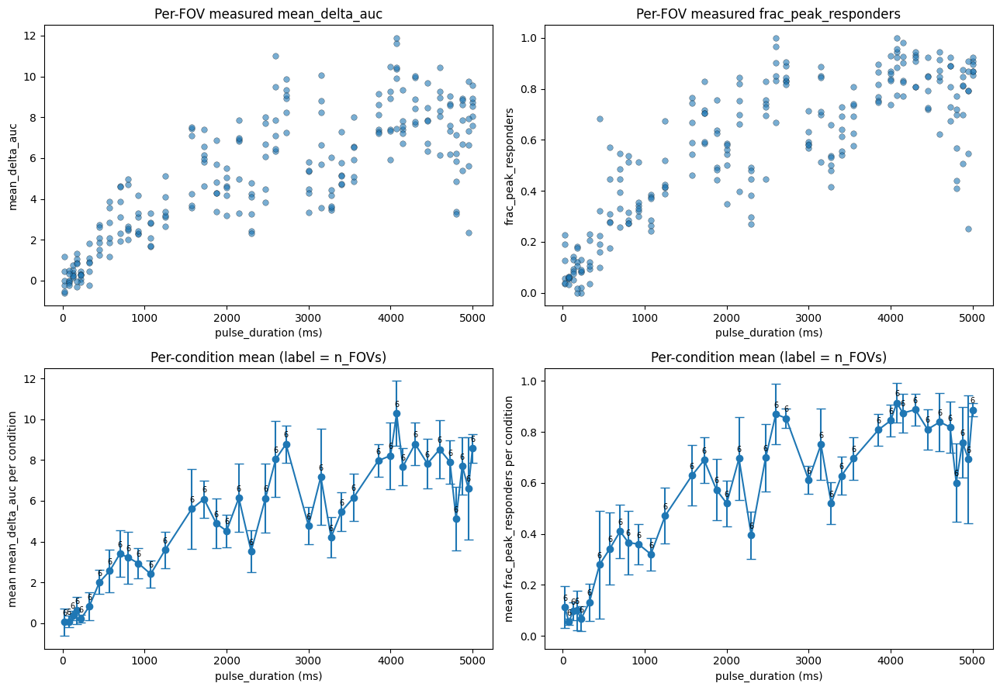

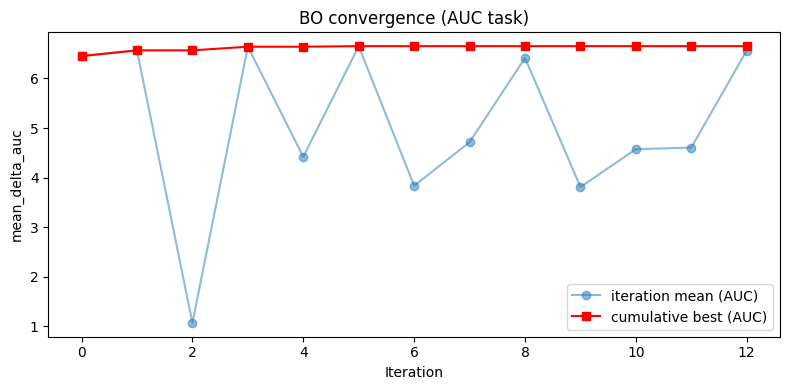

In [12]:
if agent.df_results is not None and not agent.df_results.empty:
    df = agent.df_results

    fig, axes = plt.subplots(2, 2, figsize=(13, 9))

    for col, task_col, ylabel in [
        (0, "mean_delta_auc", "mean_delta_auc"),
        (1, "frac_peak_responders", "frac_peak_responders"),
    ]:
        # Top row: per-FOV scatter
        axes[0, col].scatter(
            df["pulse_duration"],
            df[task_col],
            alpha=0.6,
            s=30,
            edgecolors="k",
            linewidths=0.3,
        )
        axes[0, col].set_xlabel("pulse_duration (ms)")
        axes[0, col].set_ylabel(ylabel)
        axes[0, col].set_title(f"Per-FOV measured {ylabel}")

        # Bottom row: per-condition mean +/- std
        cond_agg = (
            df.groupby("pulse_duration")
            .agg(
                mean_y=(task_col, "mean"),
                std_y=(task_col, "std"),
                n_fovs=(task_col, "count"),
            )
            .reset_index()
        )
        axes[1, col].errorbar(
            cond_agg["pulse_duration"],
            cond_agg["mean_y"],
            yerr=cond_agg["std_y"].fillna(0.0),
            fmt="o-",
            capsize=4,
        )
        axes[1, col].set_xlabel("pulse_duration (ms)")
        axes[1, col].set_ylabel(f"mean {ylabel} per condition")
        axes[1, col].set_title("Per-condition mean (label = n_FOVs)")
        for _, r in cond_agg.iterrows():
            axes[1, col].annotate(
                int(r["n_fovs"]),
                (r["pulse_duration"], r["mean_y"]),
                textcoords="offset points",
                xytext=(0, 6),
                ha="center",
                fontsize=7,
            )
    axes[1, 1].set_ylim(-0.05, 1.05)  # frac_peak_responders is bounded
    plt.tight_layout()
    plt.show()

    if agent._iteration_means:
        fig, ax = plt.subplots(figsize=(8, 4))
        means = np.array(agent._iteration_means)
        ax.plot(means, "o-", alpha=0.5, label="iteration mean (AUC)")
        ax.plot(
            np.maximum.accumulate(means),
            "s-",
            color="red",
            label="cumulative best (AUC)",
        )
        ax.set_xlabel("Iteration")
        ax.set_ylabel("mean_delta_auc")
        ax.set_title("BO convergence (AUC task)")
        ax.legend()
        plt.tight_layout()
        plt.show()
else:
    print("No data collected yet.")

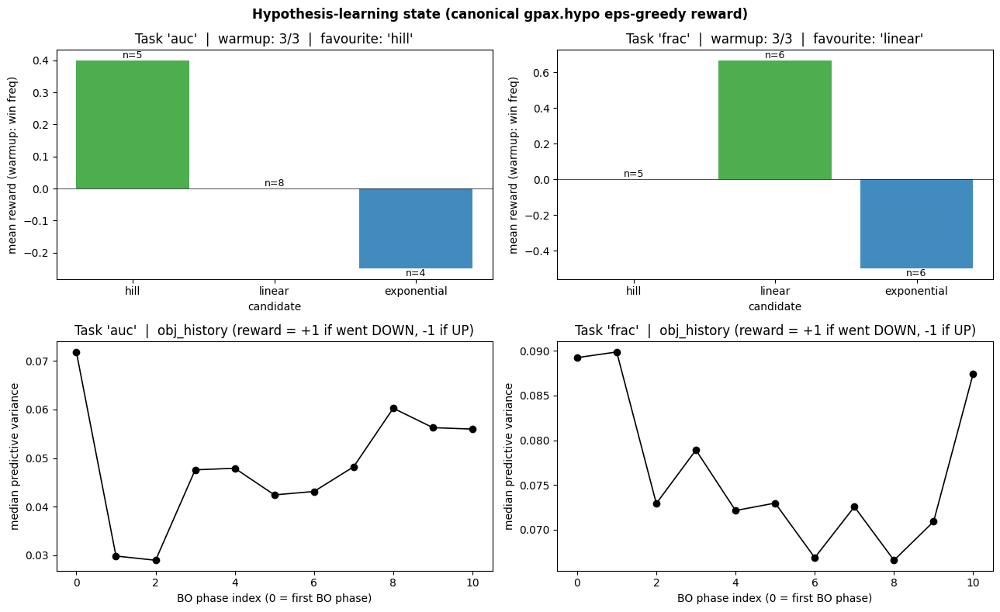

In [13]:
# Per-task hypothesis-learning diagnostics:
#   left:  mean reward per candidate (current eps-greedy favourite highlighted)
#   right: median predictive variance trajectory (the obj_history that drives reward)
fig, axes = plt.subplots(2, 2, figsize=(13, 8))

for col_i, task in enumerate(agent.TASKS):
    state = agent._task_state[task]
    candidates = list(agent.candidate_hypotheses_by_task[task])
    record = state["record"]
    obj_history = state["obj_history"]
    log = state["hypothesis_log"]
    favourite = state["selected_hypothesis"]
    n_warmup_done = state.get("n_warmup_phases_done", 0)

    # --- top: mean reward per candidate ---
    ax = axes[0, col_i]
    if not log:
        ax.text(
            0.5,
            0.5,
            "No hypothesis updates yet\n(run hasn't reached BO phase)",
            ha="center",
            va="center",
            transform=ax.transAxes,
            color="gray",
        )
    else:
        colors = ["C2" if name == favourite else "C0" for name in candidates]
        bars = ax.bar(candidates, record[:, 1], color=colors, alpha=0.85)
        for bar, n in zip(bars, record[:, 0]):
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height(),
                f"n={int(n)}",
                ha="center",
                va="bottom" if bar.get_height() >= 0 else "top",
                fontsize=9,
            )
        ax.axhline(0, color="k", lw=0.5)
    ax.set_ylabel("mean reward (warmup: win freq)")
    ax.set_xlabel("candidate")
    ax.set_title(
        f"Task {task!r}  |  warmup: {n_warmup_done}/{agent.n_warmup_phases}  "
        f"|  favourite: {favourite!r}"
    )

    # --- bottom: obj_history (median predictive variance per phase) ---
    ax = axes[1, col_i]
    if len(obj_history) < 2:
        ax.text(
            0.5,
            0.5,
            "Need >=2 phases for obj_history",
            ha="center",
            va="center",
            transform=ax.transAxes,
            color="gray",
        )
    else:
        # During warmup, hypothesis_log has multiple entries per phase (one per
        # candidate). Use obj_history's index as the phase index for plotting.
        phase_axis = list(range(len(obj_history)))
        ax.plot(phase_axis, obj_history, "o-", color="k", lw=1.2)
        ax.set_xlabel("BO phase index (0 = first BO phase)")
        ax.set_ylabel("median predictive variance")
        ax.set_title(
            f"Task {task!r}  |  obj_history " f"(reward = +1 if went DOWN, -1 if UP)"
        )

fig.suptitle(
    "Hypothesis-learning state (canonical gpax.hypo eps-greedy reward)",
    fontsize=12,
    fontweight="bold",
)
plt.tight_layout()
plt.show()

In [ ]:
# AUC-task summary: which pulse_duration was probed at which phase, and how the
# hypothesis log-evidence trajectory evolved per candidate (hill / linear / exponential).
#
# Panels:
#   (0,0) Sampling schedule    -- phase_id -> pulse_duration scatter (color = phase_id)
#   (0,1) Dose-response        -- pulse_duration -> mean_delta_auc (color = phase_id)
#   (1,0) Per-phase log_evidence for each AUC candidate (gaps = candidate not evaluated that phase)
#   (1,1) Current mean reward per candidate (final selected highlighted in green)
TASK = "auc"
task_col = agent.task_columns[TASK]

if agent.df_results is None or agent.df_results.empty:
    print("No data yet -- run the experiment first.")
else:
    df = agent.df_results.copy()
    state = agent._task_state[TASK]
    candidates = list(agent.candidate_hypotheses_by_task[TASK])
    hypo_log = state["hypothesis_log"]  # list of (phase_id, name, log_evidence)
    final = state["selected_hypothesis"]

    fig, axes = plt.subplots(2, 2, figsize=(13, 9))

    # --- (0,0) sampling schedule: phase_id vs pulse_duration ---
    ax = axes[0, 0]
    if "phase_id" in df.columns:
        sc = ax.scatter(
            df["phase_id"],
            df["pulse_duration"],
            c=df["phase_id"],
            cmap="viridis",
            s=35,
            edgecolors="k",
            linewidths=0.3,
            alpha=0.85,
        )
        plt.colorbar(sc, ax=ax, label="phase_id")
    else:
        ax.text(
            0.5,
            0.5,
            "no phase_id column in df_results",
            ha="center",
            va="center",
            transform=ax.transAxes,
            color="gray",
        )
    ax.set_xlabel("phase_id")
    ax.set_ylabel("pulse_duration (ms)")
    ax.set_title("Sampling schedule (which pulse durations per phase)")

    # --- (0,1) dose-response, phase-colored ---
    ax = axes[0, 1]
    if "phase_id" in df.columns:
        sc = ax.scatter(
            df["pulse_duration"],
            df[task_col],
            c=df["phase_id"],
            cmap="viridis",
            s=35,
            edgecolors="k",
            linewidths=0.3,
            alpha=0.85,
        )
        plt.colorbar(sc, ax=ax, label="phase_id")
    else:
        ax.scatter(
            df["pulse_duration"],
            df[task_col],
            s=35,
            edgecolors="k",
            linewidths=0.3,
            alpha=0.85,
        )
    ax.set_xlabel("pulse_duration (ms)")
    ax.set_ylabel(task_col)
    ax.set_title(f"Per-FOV {task_col} (color = phase_id)")

    # --- (1,0) per-phase log_evidence for each candidate ---
    ax = axes[1, 0]
    if not hypo_log:
        ax.text(
            0.5,
            0.5,
            "hypothesis_log is empty\n(run did not reach BO phase)",
            ha="center",
            va="center",
            transform=ax.transAxes,
            color="gray",
        )
    else:
        log_df = pd.DataFrame(hypo_log, columns=["phase_id", "name", "log_evidence"])
        cmap = plt.get_cmap("tab10")
        for i, name in enumerate(candidates):
            sub = log_df[log_df["name"] == name].sort_values("phase_id")
            if sub.empty:
                continue
            ax.plot(
                sub["phase_id"],
                sub["log_evidence"],
                marker="o",
                lw=1.2,
                color=cmap(i),
                label=f"{name}" + (" (final)" if name == final else ""),
            )
        # Shade warmup region.
        n_warm = agent.n_warmup_phases
        if log_df["phase_id"].min() is not np.nan and n_warm > 0:
            warm_start = int(log_df["phase_id"].min())
            ax.axvspan(
                warm_start - 0.5,
                warm_start + n_warm - 0.5,
                color="gray",
                alpha=0.12,
                label="warmup (fit-all)",
            )
        ax.set_xlabel("phase_id")
        ax.set_ylabel("log_evidence")
        ax.set_title(f"Per-phase log_evidence per AUC candidate")
        ax.legend(fontsize=8, loc="best")

    # --- (1,1) final mean reward per candidate ---
    ax = axes[1, 1]
    rewards = state["record"][:, 1]
    counts = state["record"][:, 0]
    colors = ["tab:green" if name == final else "tab:gray" for name in candidates]
    bars = ax.bar(candidates, rewards, color=colors, alpha=0.85)
    for bar, n in zip(bars, counts):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f"n={int(n)}",
            ha="center",
            va="bottom" if bar.get_height() >= 0 else "top",
            fontsize=9,
        )
    ax.axhline(0, color="k", lw=0.5)
    ax.set_ylabel("mean reward (post-warmup) / win-freq (warmup)")
    ax.set_title(f"Final AUC favourite: {final!r}")

    fig.suptitle(
        f"AUC task summary  |  phases run: {len(agent._iteration_means)}  |  "
        f"final hypothesis: {final!r}",
        fontsize=12,
        fontweight="bold",
    )
    plt.tight_layout()
    plt.show()

    # Compact text summary
    print(f"\nFinal selected AUC hypothesis: {final!r}")
    print("Mean reward per candidate (n = visit count):")
    for name, r, n in zip(candidates, rewards, counts):
        flag = "  <-- selected" if name == final else ""
        print(f"  {name:>12s}: reward={r:+.3f}  n={int(n)}{flag}")

In [ ]:
# Covariate-contribution diagnostics for the AUC task.
#
# Two complementary views:
#
#   LEFT  -- ARD relevance: posterior of 1 / k_length per input dim.
#            Matern + ARD learns a separate lengthscale for each input;
#            short lengthscale = GP varies quickly along that dim to explain
#            the data = informative. Bars are posterior median, error bars
#            are the 5-95% credible interval (over MCMC samples).
#            *Caveat*: lengthscale_prior_dist = Uniform(0.1, 1.0) so 1/k_length
#            is bounded in [1, 10] -- ratios across dims, not absolute values,
#            are the meaningful quantity.
#
#   RIGHT -- Decision sensitivity: hold pulse_duration at a low / mid / high
#            representative value and the other covariates at their median;
#            sweep one covariate across its 5-95% observed range; record
#            the predicted mean_delta_auc swing (max - min). Bigger swing
#            = ignoring that covariate would distort predictions more.
#            *Caveat*: one-at-a-time, ignores interactions.

import gpax
import gpax.utils

TASK = "auc"

if (
    TASK not in agent._gp_models_by_task
    or agent.df_results is None
    or agent.df_results.empty
):
    print("AUC GP not fit yet -- run the experiment first.")
else:
    gp = agent._gp_models_by_task[TASK]
    y_scaler = agent._y_scalers_by_task[TASK]
    x_scaler = agent._x_scaler

    param_names = [p.name for p in agent.parameters_to_optimize]
    cov_names = [c.name for c in agent.bo_covariates]
    dim_names = param_names + cov_names  # GP input order: params first, then covariates
    n_params = len(param_names)

    samples = gp.get_samples(chain_dim=False)
    if "k_length" not in samples:
        print("k_length not in MCMC samples -- non-ARD kernel? skipping ARD panel.")
        k_length = None
    else:
        k_length = np.asarray(samples["k_length"])  # (S, D) in scaled-input space

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # ---------- LEFT: ARD relevance per input dim ----------
    ax = axes[0]
    if k_length is None or k_length.ndim != 2 or k_length.shape[1] != len(dim_names):
        ax.text(
            0.5,
            0.5,
            "k_length not available or shape mismatch",
            ha="center",
            va="center",
            transform=ax.transAxes,
            color="gray",
        )
    else:
        relevance = 1.0 / k_length
        rel_med = np.median(relevance, axis=0)
        rel_lo = np.quantile(relevance, 0.05, axis=0)
        rel_hi = np.quantile(relevance, 0.95, axis=0)
        rel_pct = 100.0 * rel_med / rel_med.sum()
        colors = [
            "tab:blue" if i < n_params else "tab:orange" for i in range(len(dim_names))
        ]
        ax.bar(
            dim_names,
            rel_med,
            yerr=[rel_med - rel_lo, rel_hi - rel_med],
            color=colors,
            alpha=0.85,
            capsize=4,
        )
        for i, pct in enumerate(rel_pct):
            ax.text(i, rel_hi[i], f"{pct:.0f}%", ha="center", va="bottom", fontsize=9)
        ax.set_ylabel("1 / k_length (posterior median, 5-95% CI)")
        ax.set_title("ARD relevance (Matern lengthscale, scaled inputs)")
        plt.setp(ax.get_xticklabels(), rotation=20, ha="right")
        legend_handles = [
            plt.Rectangle(
                (0, 0), 1, 1, color="tab:blue", alpha=0.85, label="parameter"
            ),
            plt.Rectangle(
                (0, 0), 1, 1, color="tab:orange", alpha=0.85, label="covariate"
            ),
        ]
        ax.legend(handles=legend_handles, fontsize=8, loc="upper right")

    # ---------- RIGHT: predictive sensitivity sweep ----------
    ax = axes[1]
    df = agent.df_results
    cov_vals = df[cov_names].to_numpy(dtype=float)
    cov_med = np.median(cov_vals, axis=0)
    pulse_obs = df[param_names[0]].to_numpy()
    pulse_repr = np.quantile(pulse_obs, [0.1, 0.5, 0.9])
    n_sweep = 25

    rng_key, rng_key_pred = gpax.utils.get_keys()
    sensitivities = np.zeros((len(pulse_repr), len(cov_names)))

    for j, pulse_fixed in enumerate(pulse_repr):
        for i, _cov_name in enumerate(cov_names):
            cov_range = np.linspace(
                np.quantile(cov_vals[:, i], 0.05),
                np.quantile(cov_vals[:, i], 0.95),
                n_sweep,
            )
            cov_sweep = np.tile(cov_med, (n_sweep, 1))
            cov_sweep[:, i] = cov_range
            x_full = np.column_stack([np.full(n_sweep, pulse_fixed), cov_sweep])
            x_scaled = x_scaler.transform(x_full)
            y_pred_scaled, _ = gp.predict_in_batches(
                rng_key_pred,
                x_scaled,
                batch_size=1000,
                n=4,
                noiseless=True,
            )
            y_pred = y_scaler.inverse_transform(
                np.asarray(y_pred_scaled).reshape(-1, 1)
            ).flatten()
            sensitivities[j, i] = y_pred.max() - y_pred.min()

    bar_width = 0.25
    x = np.arange(len(cov_names))
    for j, pulse_fixed in enumerate(pulse_repr):
        ax.bar(
            x + (j - 1) * bar_width,
            sensitivities[j],
            width=bar_width,
            label=f"pulse={pulse_fixed:.0f} ms",
            alpha=0.85,
        )
    ax.set_xticks(x)
    ax.set_xticklabels(cov_names, rotation=20, ha="right")
    ax.set_ylabel(
        "predicted mean_delta_auc swing\n(max - min over 5-95% covariate range)"
    )
    ax.set_title("Decision sensitivity (one-at-a-time, others fixed at median)")
    ax.legend(fontsize=8)

    fig.suptitle(
        "AUC task -- how much do covariates contribute?", fontsize=12, fontweight="bold"
    )
    plt.tight_layout()
    plt.show()

    # ----- Text summary -----
    if k_length is not None and k_length.shape[1] == len(dim_names):
        print("ARD relevance ranking (higher = more informative input):")
        order = np.argsort(rel_med)[::-1]
        for idx in order:
            kind = "param" if idx < n_params else "covariate"
            print(
                f"  {dim_names[idx]:>22s} ({kind:>9s}): "
                f"1/l = {rel_med[idx]:.3f}  ({rel_pct[idx]:.1f}% of total)"
            )

    print(
        "\nDecision sensitivity (predicted AUC swing per covariate, averaged over pulse levels):"
    )
    sens_mean = sensitivities.mean(axis=0)
    for i, name in enumerate(cov_names):
        print(
            f"  {name:>22s}: avg swing = {sens_mean[i]:.4f}  "
            f"(low={sensitivities[0, i]:.4f}, mid={sensitivities[1, i]:.4f}, "
            f"high={sensitivities[2, i]:.4f})"
        )

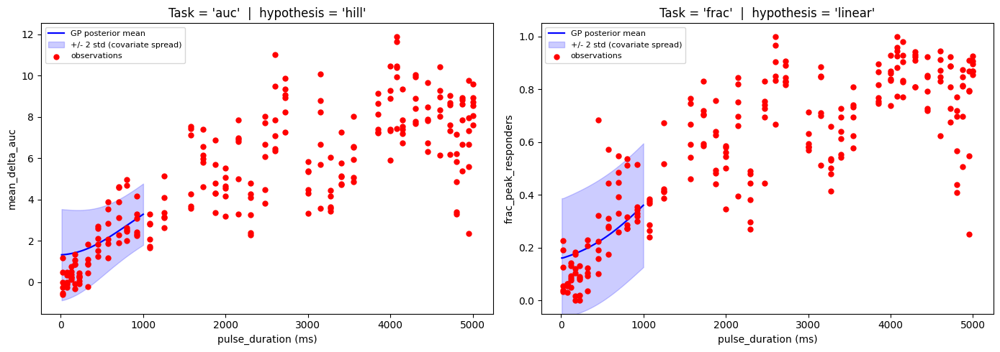

In [14]:
# GP-predicted dose-response curves per task (marginalised over covariates).
import gpax
import gpax.utils

if (
    agent._gp_models_by_task
    and agent.df_results is not None
    and not agent.df_results.empty
):
    df = agent.df_results

    rng_key, rng_key_pred = gpax.utils.get_keys()
    pulse_grid = np.arange(10.0, 1000.0 + 10.0, 10.0)

    n_cov_samples = 50
    cov_vals = df[[c.name for c in agent.bo_covariates]].to_numpy(dtype=float)
    rng = np.random.default_rng(0)
    cov_idx = rng.integers(0, cov_vals.shape[0], size=n_cov_samples)
    cov_samples = cov_vals[cov_idx]

    x_full = np.hstack(
        [
            np.repeat(pulse_grid[:, None], n_cov_samples, axis=0),
            np.tile(cov_samples, (len(pulse_grid), 1)),
        ]
    )
    x_full_scaled = agent._x_scaler.transform(x_full)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    for ax_idx, task in enumerate(agent.TASKS):
        ax = axes[ax_idx]
        gp_model = agent._gp_models_by_task[task]
        y_scaler = agent._y_scalers_by_task[task]
        col = agent.task_columns[task]

        y_pred_scaled, _ = gp_model.predict_in_batches(
            rng_key_pred,
            x_full_scaled,
            batch_size=1000,
            n=8,
            noiseless=True,
        )
        y_pred_logit_or_lin = y_scaler.inverse_transform(
            np.asarray(y_pred_scaled).reshape(-1, 1)
        ).flatten()
        # If task is logit-scaled, invert back to probability space.
        if agent.task_logit[task]:
            y_pred = _inv_logit(y_pred_logit_or_lin)
        else:
            y_pred = y_pred_logit_or_lin

        y_pred_2d = y_pred.reshape(len(pulse_grid), n_cov_samples)
        y_pred_mean = y_pred_2d.mean(axis=1)
        y_pred_std = y_pred_2d.std(axis=1)

        ax.plot(pulse_grid, y_pred_mean, "b-", lw=1.6, label="GP posterior mean")
        ax.fill_between(
            pulse_grid,
            y_pred_mean - 2 * y_pred_std,
            y_pred_mean + 2 * y_pred_std,
            alpha=0.2,
            color="blue",
            label="+/- 2 std (covariate spread)",
        )
        ax.scatter(
            df["pulse_duration"],
            df[col],
            c="red",
            s=25,
            zorder=5,
            label="observations",
        )
        ax.set_xlabel("pulse_duration (ms)")
        ax.set_ylabel(col)
        locked = agent._task_state[task]["selected_hypothesis"]
        ax.set_title(
            f"Task = {task!r}  |  hypothesis = {locked!r}"
            if locked
            else f"Task = {task!r}  (current best, not yet locked)"
        )
        ax.legend(fontsize=8)
        if agent.task_logit[task]:
            ax.set_ylim(-0.05, 1.05)

    plt.tight_layout()
    plt.show()
else:
    print("GPs not fit yet (run hasn't reached BO phase).")